# <center>Will They Pay?</center>
### <center>A machine learning solution to understand mobile app user payment behavior</center>

<img src="data/image.webp" style="width:900px;height:600px"/>

Since the launch of modern smartphone in 2007, the mobile phone industry has proliferated. Over 3 billion people spend substantial amounts of their day using apps on their smartphones with global internet penetration standing at 57%. Today, there are almost 2.46 million apps available for download in Google Playstore, 1.96 million in Apple App Store, 700,000 in Windows Store, and 479,000 in Amazon Appstore.  Although many have seen mammoth success, most of them turn out to be unsuccessful. Of paid apps, about 90 percent are downloaded less than 500 times per day — and earn less than $1,250 a day. Moreover, 80% of them received less than 100 downloads. While competition in the app market is high, failure isn’t always a result of getting lost in the noise. In most cases, there are other contributing factors. Poorly researched market and audience would most likely top that list.

In this project, we will use the [Worldwide Mobile App User Behavior Dataset](https://doi.org/10.7910/DVN/27459) to predict if a users pays for apps or not. We will also use novel model interpretability libraries like SHAP, Eli5 and Permutaion Importance to further understand the predictions and the features responsible.

In [1]:
# Importing libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
# Importing data
clean_df = pd.read_pickle('./Data/clean_data.pkl')

In [3]:
# Using data from completed responses
complete = clean_df[clean_df.response == 1]

In [4]:
"""
Printing columns that are object types. We will filter out many of these as one hot encoding of these makes our data wide
these are neta data from the machine that the users were taking the survey from
"""
object_columns = list(complete.select_dtypes(include=['object']).columns)
object_columns

['browser',
 'browser_version',
 'os',
 'screen_resolution',
 'flash_version',
 'user_agent',
 'manufacturer',
 'model',
 'app_store',
 'knows_app_store',
 'most_spent_on_app',
 'app_name_most_spent',
 'why_most_spent_app',
 'feature_most_spent_app',
 'avg_app_expensive_per_month',
 'gender',
 'marital_status',
 'nationality',
 'residence',
 'first_language',
 'ethnicity',
 'level_of_education',
 'disability',
 'employment_status',
 'occupation',
 'currency']

In [5]:
# Target variable
complete.do_not_pay_for_apps.value_counts(dropna=False)

1.0    2727
NaN    2097
Name: do_not_pay_for_apps, dtype: int64

We see that the data is fairly distributed in each of the 2 classes.

In [6]:
# Filling all NaN values in dataframe with 0 as the data is very sparse and  most of the columns are booleans
complete = complete.fillna(0)

In [7]:
# Creating data by dropping target variable and other object type columns most of which are metadata
dropped = complete.drop(['do_not_pay_for_apps', 'to_remove_advertisements', 'on_sale', 'subscribe_to_free_content', 
                         'additional_features', 'no_similar_free_app', 'paid_apps_are_better', 
                         'paid_apps_have_more_features', 'additional_content', 'subscribe_to_paid_content', 
                         'paid_app_appears_better', 'why_spend_on_app_other', 'startdate', 'enddate', 'browser', 
                         'browser_version', 'os', 'screen_resolution', 'flash_version', 'user_agent', 'model', 
                         'most_spent_on_app', 'app_name_most_spent', 'why_most_spent_app', 'feature_most_spent_app', 
                         'avg_app_expensive_per_month', 'currency', 'response', 'ownership', 'usage'], axis=1)

In [8]:
# Creating dummy columns
X = pd.get_dummies(data=dropped, columns=['manufacturer', 'app_store', 'knows_app_store', 'gender', 'marital_status',
                                          'nationality', 'residence', 'first_language', 'ethnicity', 'level_of_education',
                                          'disability', 'employment_status', 'occupation'])

In [9]:
# Target variable
y = complete['do_not_pay_for_apps']

In [10]:
# Test-Train split
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.3, random_state=42)

# Models

In [11]:
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier, ExtraTreesClassifier, VotingClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV, cross_val_score, StratifiedKFold, learning_curve
from sklearn.metrics import accuracy_score, classification_report

sns.set(style='white', context='notebook', palette='deep')

In [12]:
kfold = StratifiedKFold(n_splits=10)

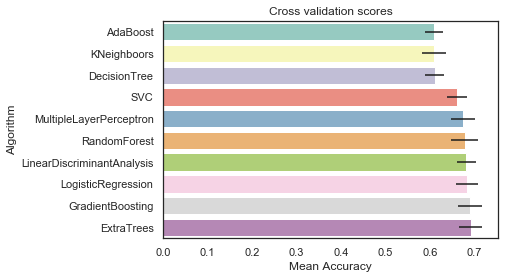

In [13]:
# Modeling step Test differents algorithms 
random_state = 42
classifiers = []
classifiers.append(SVC(random_state=random_state))
classifiers.append(DecisionTreeClassifier(random_state=random_state))
classifiers.append(AdaBoostClassifier(DecisionTreeClassifier(random_state=random_state),random_state=random_state,learning_rate=0.1))
classifiers.append(RandomForestClassifier(random_state=random_state))
classifiers.append(ExtraTreesClassifier(random_state=random_state))
classifiers.append(GradientBoostingClassifier(random_state=random_state))
classifiers.append(MLPClassifier(random_state=random_state, max_iter=1000))
classifiers.append(KNeighborsClassifier())
classifiers.append(LogisticRegression(random_state=random_state, max_iter=1000))
classifiers.append(LinearDiscriminantAnalysis())

cv_results = []
for classifier in classifiers:
    cv_results.append(cross_val_score(classifier, X_train, y=y_train, scoring="accuracy", cv=kfold, n_jobs=4))

cv_means = []
cv_std = []
for cv_result in cv_results:
    cv_means.append(cv_result.mean())
    cv_std.append(cv_result.std())

accuracies = []
for classifier in classifiers:
    classifier.fit(X_train, y_train)
    accuracies.append(accuracy_score(y_test, classifier.predict(X_test)))

cv_res = pd.DataFrame({"CrossValMeans":cv_means,
                       "CrossValerrors":cv_std,
                       "TestingAccuracy":accuracies,
                       "Algorithm":["SVC", "DecisionTree", "AdaBoost", "RandomForest", "ExtraTrees", "GradientBoosting",
                                    "MultipleLayerPerceptron", "KNeighboors", "LogisticRegression",
                                    "LinearDiscriminantAnalysis"]})

g = sns.barplot("CrossValMeans", "Algorithm", data=cv_res.sort_values(by=['CrossValMeans']), palette="Set3", orient="h", **{'xerr':cv_std})
g.set_xlabel("Mean Accuracy")
g = g.set_title("Cross validation scores")

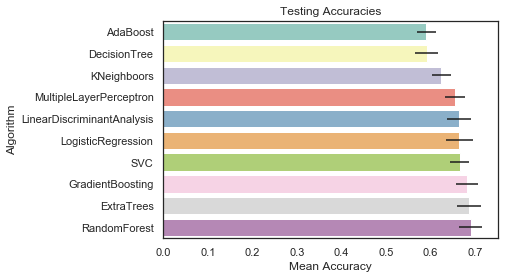

In [14]:
g = sns.barplot("TestingAccuracy", "Algorithm", data=cv_res.sort_values(by=['TestingAccuracy']), palette="Set3", orient="h")
g.set_xlabel("Mean Accuracy")
g = g.set_title("Testing Accuracies")

In [15]:
cv_res[['Algorithm', 'CrossValMeans', 'CrossValerrors', 'TestingAccuracy']]

,Algorithm,CrossValMeans,CrossValerrors,TestingAccuracy
0,SVC,0.660258,0.021127,0.665055
1,DecisionTree,0.610786,0.025990,0.591160
2,AdaBoost,0.608711,0.021132,0.590470
3,RandomForest,0.677445,0.022665,0.689917
4,ExtraTrees,0.691063,0.026777,0.685773
5,GradientBoosting,0.689871,0.030667,0.680939
6,MultipleLayerPerceptron,0.674486,0.021004,0.654696
7,KNeighboors,0.608717,0.024475,0.623619
8,LogisticRegression,0.683639,0.026799,0.664365
9,LinearDiscriminantAnalysis,0.681863,0.025312,0.662983


Random Forest has the best test accuracy of 68.99%, whereas Extra Trees Classifier has the best validation accuracy of 69.11%

# Hyperparameter Tuning

In this section, we will tune some of the best performing models from above and compare their accuracies.

In [16]:
# Adaboost Parameters tunning 
DTC = DecisionTreeClassifier()

adaDTC = AdaBoostClassifier(DTC, random_state=42)

# Search grid for optimal parameters
ada_param_grid = {"base_estimator__criterion" : ["gini", "entropy"], 
                  "base_estimator__splitter" : ["best", "random"], 
                  "algorithm" : ["SAMME", "SAMME.R"], 
                  "n_estimators" : [1, 2],
                  "learning_rate":  [0.0001, 0.001, 0.01, 0.1, 0.2, 0.3,1.5]}

gsadaDTC = GridSearchCV(adaDTC, param_grid=ada_param_grid, cv=kfold, scoring="accuracy", n_jobs=-1, verbose=1)
gsadaDTC.fit(X_train,y_train)
ada_best = gsadaDTC.best_estimator_

Fitting 10 folds for each of 112 candidates, totalling 1120 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    3.3s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:   14.8s
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:   39.6s
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 1120 out of 1120 | elapsed:  1.9min finished


In [17]:
# ExtraTrees Parameters tunning 
ExtC = ExtraTreesClassifier()

# Search grid for optimal parameters
ex_param_grid = {"max_depth" : [None],
                 "max_features" : [1, 3, 10],
                 "min_samples_split" : [2, 3, 10],
                 "min_samples_leaf" : [1, 3, 10],
                 "bootstrap" : [False],
                 "n_estimators" : [100,300],
                 "criterion" : ["gini"]}

gsExtC = GridSearchCV(ExtC, param_grid=ex_param_grid, cv=kfold, scoring="accuracy", n_jobs=4, verbose=1)
gsExtC.fit(X_train,y_train)
ExtC_best = gsExtC.best_estimator_

Fitting 10 folds for each of 54 candidates, totalling 540 fits


[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:   21.1s
[Parallel(n_jobs=4)]: Done 192 tasks      | elapsed:  1.1min
[Parallel(n_jobs=4)]: Done 442 tasks      | elapsed:  3.9min
[Parallel(n_jobs=4)]: Done 540 out of 540 | elapsed:  5.2min finished


In [18]:
# RFC Parameters tunning 
RFC = RandomForestClassifier()

# Search grid for optimal parameters
rf_param_grid = {"max_depth": [None],
                 "max_features": [1, 3, 10],
                 "min_samples_split": [2, 3, 10],
                 "min_samples_leaf": [1, 3, 10],
                 "bootstrap": [False],
                 "n_estimators": [100, 300],
                 "criterion": ["gini"]}

gsRFC = GridSearchCV(RFC, param_grid=rf_param_grid, cv=kfold, scoring="accuracy", n_jobs=-1, verbose=1)
gsRFC.fit(X_train,y_train)
RFC_best = gsRFC.best_estimator_

Fitting 10 folds for each of 54 candidates, totalling 540 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   24.0s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 540 out of 540 | elapsed:  5.4min finished


In [19]:
# Gradient boosting tunning
GBC = GradientBoostingClassifier()

# Search grid for optimal parameters
gb_param_grid = {'loss' : ["deviance"],
                 'n_estimators' : [100, 200, 300],
                 'learning_rate': [0.1, 0.05, 0.01],
                 'max_depth': [4, 8],
                 'min_samples_leaf': [100, 150],
                 'max_features': [0.3, 0.1]}

gsGBC = GridSearchCV(GBC, param_grid=gb_param_grid, cv=kfold, scoring="accuracy", n_jobs=-1, verbose=1)
gsGBC.fit(X_train,y_train)
GBC_best = gsGBC.best_estimator_

Fitting 10 folds for each of 72 candidates, totalling 720 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   34.4s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  6.5min
[Parallel(n_jobs=-1)]: Done 720 out of 720 | elapsed:  9.8min finished


In [20]:
# SVC classifier Parameters tunning 
SVMC = SVC(probability=True)

# Search grid for optimal parameters
svc_param_grid = {'kernel': ['rbf'], 
                  'gamma': [ 0.001, 0.01, 0.1, 1],
                  'C': [1, 10, 50, 100, 200, 300, 1000]}

gsSVMC = GridSearchCV(SVMC, param_grid=svc_param_grid, cv=kfold, scoring="accuracy", n_jobs=-1, verbose=1)
gsSVMC.fit(X_train,y_train)
SVMC_best = gsSVMC.best_estimator_

Fitting 10 folds for each of 28 candidates, totalling 280 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:  9.6min
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed: 41.5min
[Parallel(n_jobs=-1)]: Done 280 out of 280 | elapsed: 58.9min finished


In [21]:
classifiers = [gsadaDTC, gsExtC, gsRFC, gsGBC, gsSVMC]

scores = []
for classifier in classifiers:
    scores.append(classifier.best_score_)

accuracies = []
for classifier in classifiers:
    accuracies.append(accuracy_score(y_test, classifier.best_estimator_.predict(X_test)))

results = pd.DataFrame({"Algorithm":["AdaBoost", "ExtraTrees", "RandomForest", "GradientBoosting", "SVC"],
                        "ValidationBestScore":scores,
                        "TestingAccuracy":accuracies})

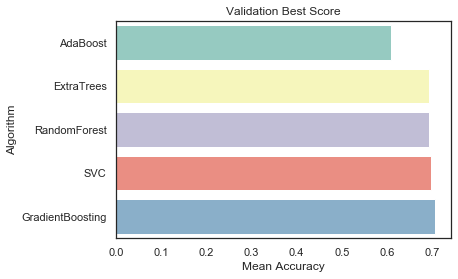

In [23]:
g = sns.barplot("ValidationBestScore", "Algorithm", data=results.sort_values(by=['ValidationBestScore']), 
                palette="Set3", orient="h")
g.set_xlabel("Mean Accuracy")
g = g.set_title("Validation Best Score")

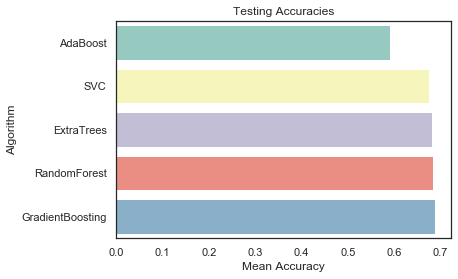

In [24]:
g = sns.barplot("TestingAccuracy", "Algorithm", data=results.sort_values(by=['TestingAccuracy']), palette="Set3", orient="h")
g.set_xlabel("Mean Accuracy")
g = g.set_title("Testing Accuracies")

In [25]:
results[['Algorithm', 'ValidationBestScore', 'TestingAccuracy']]

,Algorithm,ValidationBestScore,TestingAccuracy
0,AdaBoost,0.608711,0.590470
1,ExtraTrees,0.692557,0.681630
2,RandomForest,0.694323,0.685083
3,GradientBoosting,0.706759,0.688536
4,SVC,0.696976,0.675414


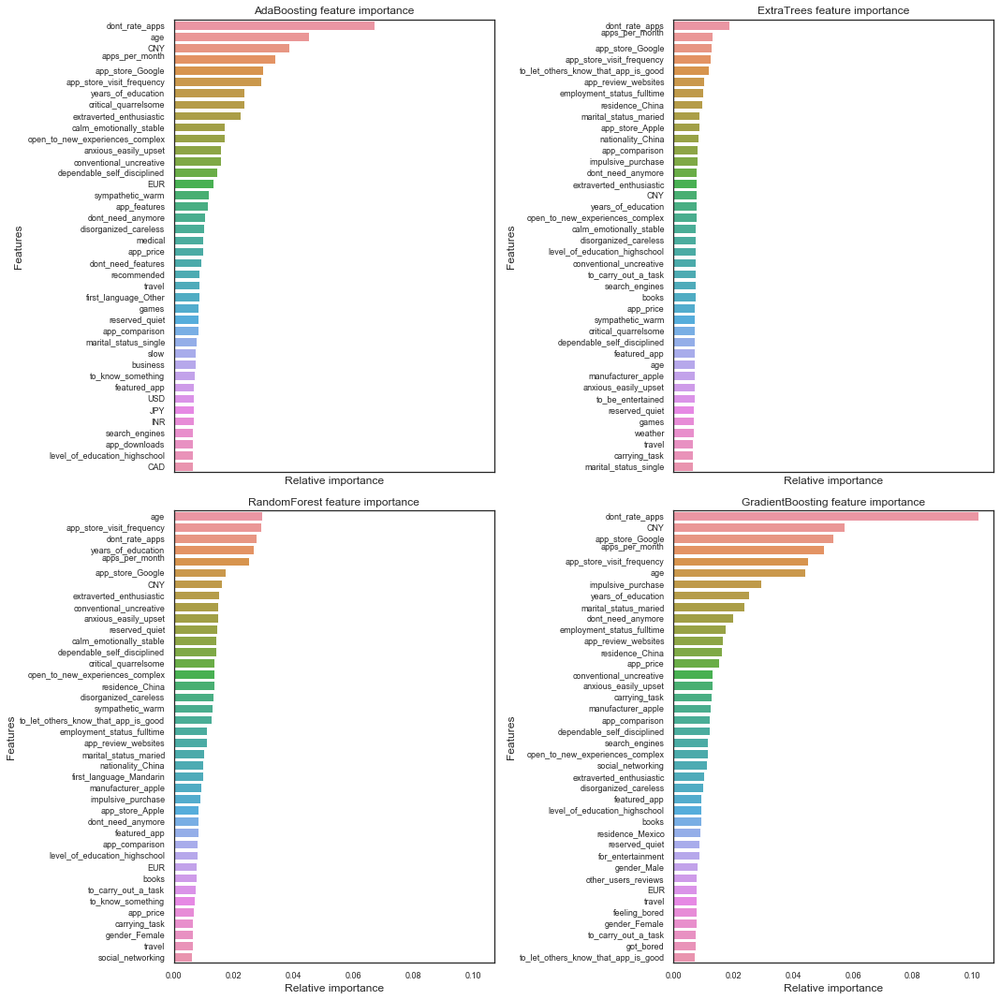

In [26]:
nrows = ncols = 2
fig, axes = plt.subplots(nrows = nrows, ncols = ncols, sharex="all", figsize=(15,15))

names_classifiers = [("AdaBoosting", ada_best),("ExtraTrees",ExtC_best),("RandomForest",RFC_best),("GradientBoosting",GBC_best)]

nclassifier = 0
for row in range(nrows):
    for col in range(ncols):
        name = names_classifiers[nclassifier][0]
        classifier = names_classifiers[nclassifier][1]
        indices = np.argsort(classifier.feature_importances_)[::-1][:40]
        g = sns.barplot(y=X.columns[indices][:40],x=classifier.feature_importances_[indices][:40], orient='h', ax=axes[row][col])
        g.set_xlabel("Relative importance",fontsize=12)
        g.set_ylabel("Features",fontsize=12)
        g.tick_params(labelsize=9)
        g.set_title(name + " feature importance")
        plt.tight_layout()
        nclassifier += 1

We see that the most important features contributing to our models are same.

In [27]:
# Voting Classifier
votingC = VotingClassifier(estimators=[('rfc', RFC_best), ('extc', ExtC_best),
                                       ('svc', SVMC_best), ('adac',ada_best),('gbc',GBC_best)], voting='soft', n_jobs=4)

votingC = votingC.fit(X_train, y_train)

In [28]:
vote_pred = votingC.predict(X_test)

In [29]:
from sklearn.metrics import classification_report
print(classification_report(y_test, vote_pred))

              precision    recall  f1-score   support

         0.0       0.67      0.55      0.61       629
         1.0       0.70      0.80      0.74       819

    accuracy                           0.69      1448
   macro avg       0.69      0.67      0.67      1448
weighted avg       0.69      0.69      0.68      1448



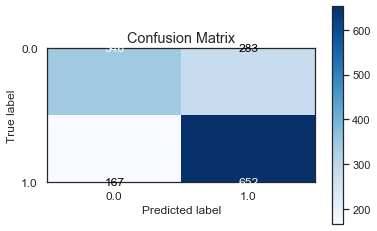

In [30]:
import scikitplot as skplt
skplt.metrics.plot_confusion_matrix(y_test, vote_pred)

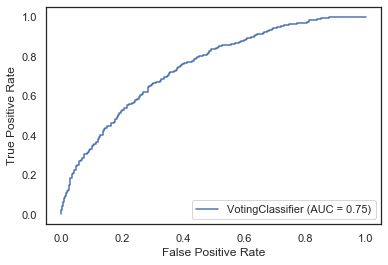

In [31]:
from sklearn import metrics
metrics.plot_roc_curve(votingC, X_test, y_test)

# Model Interpretability

In this section, we will use SHAP, Eli5 and Permutation Probaility libraries to understand the predictions of our models and their interaction with features.

In [32]:
import shap
# Need to load JS vis in the notebook
shap.initjs()

In [33]:
explainer = shap.TreeExplainer(ExtC_best)

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


In [34]:
# Calculate Shap values
shap_values = explainer.shap_values(X)

In [35]:
shap.force_plot(explainer.expected_value[1], shap_values[1][0,:], X.iloc[4,:])

This amazing force plot helps use understand our prediction and the feautes responsible. For this particular row in the data, the Extra Trees Classifer predicted that the user pays for apps with probability 95%. The features and their respective values are seen on the plot as well. Employment status that the user is not a student was the most contributing feature to push the expected value higher whereas the user is not a resident of China pushed the expected value lower.

In [39]:
shap.force_plot(explainer.expected_value[1], shap_values[1][:1000,:], X.iloc[:1000,:])

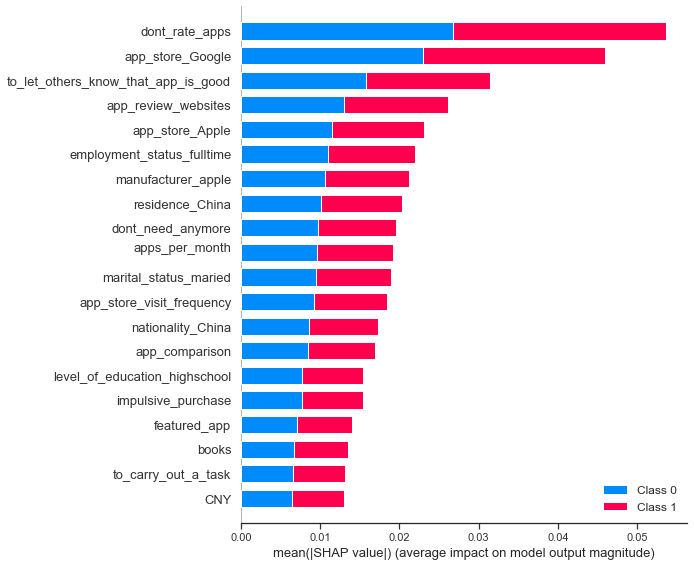

In [40]:
shap.summary_plot(shap_values, X)

**Eli5**

In [44]:
import eli5

eli5.show_weights(ExtC_best, feature_names=X_train.columns.tolist(), show_feature_values=True)

The sklearn.metrics.scorer module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.metrics. Anything that cannot be imported from sklearn.metrics is now part of the private API.
The sklearn.feature_selection.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.feature_selection. Anything that cannot be imported from sklearn.feature_selection is now part of the private API.


Weight,Feature
0.0188 ± 0.0272,dont_rate_apps
0.0130 ± 0.0163,apps_per_month
0.0128 ± 0.0133,app_store_Google
0.0123 ± 0.0140,app_store_visit_frequency
0.0119 ± 0.0178,to_let_others_know_that_app_is_good
0.0103 ± 0.0151,app_review_websites
0.0099 ± 0.0124,employment_status_fulltime
0.0095 ± 0.0227,residence_China
0.0086 ± 0.0076,marital_status_maried
0.0086 ± 0.0124,app_store_Apple


In [45]:
i = 4
X_test.iloc[[i]]

,participant_type,java_support,app_store_visit_frequency,apps_per_month\n,feeling_depressed,to_carry_out_a_task,feeling_bored,to_be_entertained,to_know_something,look_for_apps_other,...,occupation_business,occupation_education,occupation_engineering,occupation_food,occupation_healthcare,occupation_legal,occupation_military,occupation_other,occupation_service,occupation_student
id,,,,,,,,,,,,,,,,,,,,,
5755,2,1.0,5.0,2.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0,0,0,0,0,0,0,0,1,0


In [46]:
y_test.iloc[i]

1.0

In [47]:
eli5.show_prediction(ExtC_best, X_test.iloc[i], feature_names=X_train.columns.tolist(), show_feature_values=True)

**Permutation Importance**

In [48]:
from eli5.sklearn import PermutationImportance

In [49]:
perm = PermutationImportance(votingC, scoring="balanced_accuracy")

In [50]:
perm.fit(X_test, y_test)
eli5.show_weights(perm, feature_names=X_train.columns.tolist())

Weight,Feature
0.0156 ± 0.0109,app_store_Google
0.0108 ± 0.0075,dont_rate_apps
0.0071 ± 0.0088,app_store_visit_frequency
0.0051 ± 0.0048,app_price
0.0043 ± 0.0051,to_carry_out_a_task
0.0040 ± 0.0022,app_review_websites
0.0034 ± 0.0036,features_are_extra
0.0030 ± 0.0035,residence_Mexico
0.0029 ± 0.0067,impulsive_purchase
0.0028 ± 0.0014,level_of_education_masters


With model interpretability models, we can see which features are responsible for the predictions and to what extent. This can help stakeholders and domain experts to a greater extend and work with those features to improve the services, products, etc.